In [61]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns



df = pd.read_csv('C:/Users/pbona/Downloads/Electric_Vehicle_Population_Data.csv')
print(df)


        VIN (1-10)        County       City State  Postal Code  Model Year  \
0       5YJSA1E22K          King    Seattle    WA      98112.0        2019   
1       3MW39FS05R        Yakima     Zillah    WA      98953.0        2024   
2       1N4AZ0CP0F          King       Kent    WA      98031.0        2015   
3       5YJSA1H20F     Snohomish    Bothell    WA      98012.0        2015   
4       JTMAB3FV1N        Yakima     Yakima    WA      98908.0        2022   
...            ...           ...        ...   ...          ...         ...   
191402  5YJ3E1EA0K        Pierce     Sumner    WA      98390.0        2019   
191403  JN1BF0BA7P        Pierce   Wilkeson    WA      98396.0        2023   
191404  7SAYGDEE4R          King  Fall City    WA      98024.0        2024   
191405  7SAXCBE65N  Grays Harbor   Aberdeen    WA      98520.0        2022   
191406  7SAYGAEEXP        Benton   Richland    WA      99352.0        2023   

          Make       Model                   Electric Vehicle T

Check for the null values if any

In [62]:
df.isnull().sum()

VIN (1-10)                                             0
County                                                 4
City                                                   4
State                                                  0
Postal Code                                            4
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 414
DOL Vehicle ID                                         0
Vehicle Location                                       8
Electric Utility                                       4
2020 Census Tract                                      4
dtype: int64

Drop null values

In [65]:
df.dropna(inplace=True)
df.isnull().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

Who is the highest Maker of Evs?

<function matplotlib.pyplot.show(close=None, block=None)>

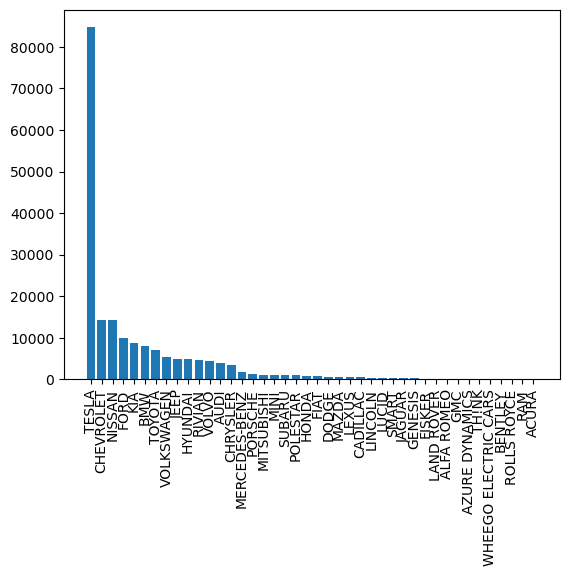

In [17]:
make_counts = df['Make'].value_counts()
#plt.figure(figsize=(30,30))
plt.bar(make_counts.index,make_counts.values)
plt.xticks(rotation='vertical',)
plt.show

Top 10 cities with number of Evs in washington?

<function matplotlib.pyplot.show(close=None, block=None)>

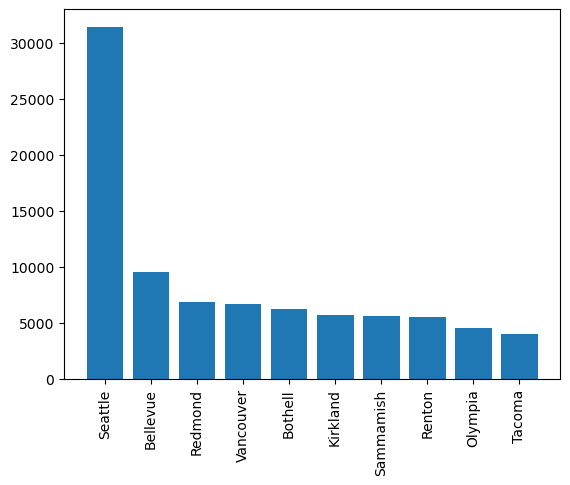

In [18]:
make_counts = df['City'].value_counts()
top_10_makes = make_counts.head(10)
#plt.figure(figsize=(30,30))
plt.bar(top_10_makes.index,top_10_makes.values)
plt.xticks(rotation='vertical',)
plt.show

How does Age of a model reflects on Electric range?

In [19]:
df['Age'] = 2024 - df['Model Year']


       Electric Range            Age
count   191407.000000  191407.000000
mean        55.657442       3.267665
std         90.151930       2.990487
min          0.000000      -1.000000
25%          0.000000       1.000000
50%          0.000000       2.000000
75%         72.000000       5.000000
max        337.000000      27.000000


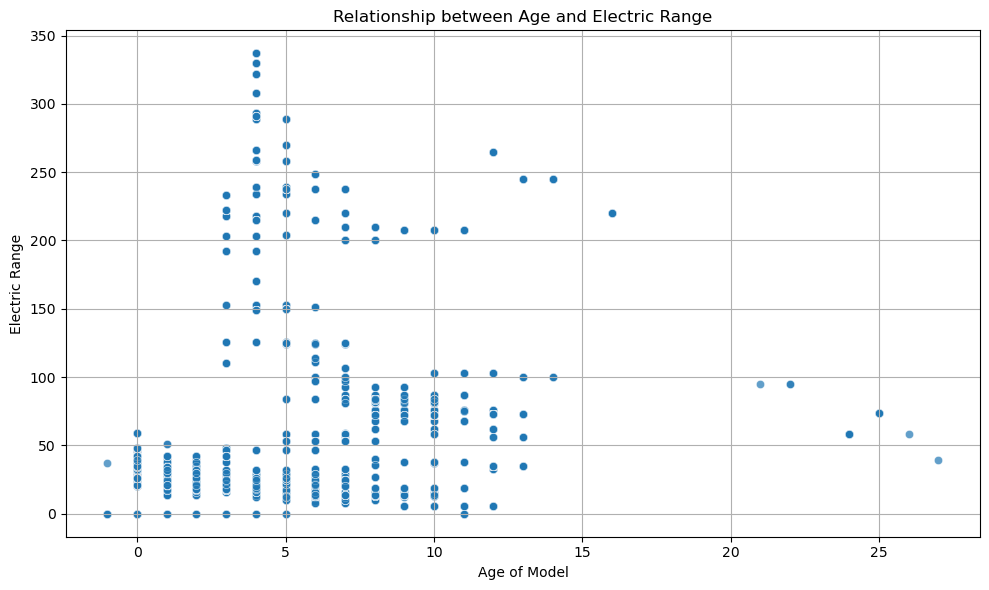

In [20]:
print(df[['Electric Range', 'Age']].describe())

# Visualize distribution and relationship
plt.figure(figsize=(10, 6))

# Scatter plot
sns.scatterplot(data=df, x='Age', y='Electric Range', alpha=0.7)
plt.title('Relationship between Age and Electric Range')
plt.xlabel('Age of Model')
plt.ylabel('Electric Range')
plt.grid(True)
plt.tight_layout()
plt.show()

In [21]:
correlation = df['Electric Range'].corr(df['Age'])
print(f'Correlation coefficient (Pearson\'s r): {correlation}')

Correlation coefficient (Pearson's r): 0.49169828904241747


In [25]:
fig = px.scatter(df, x='Age', y='Electric Range', color='Model',
                 hover_data=['Model'], title='Electric Range vs Age for Each Vehicle Model',
                 labels={'Age': 'Age of Model', 'Electric Range': 'Electric Range'},
                 template='plotly_white')

# Customize the layout
fig.update_layout(
    xaxis_title='Age of Model',
    yaxis_title='Electric Range',
    hovermode='closest',
    showlegend=True
)

for trace in fig.data:
    trace.visible = True

# Define callback for toggling trace visibility
def update_trace_visibility(trace, points, selector):
    for trace_idx in range(len(fig.data)):
        fig.data[trace_idx].visible = False
    trace.visible = True

# Assign callback function to each trace
for trace in fig.data:
    trace.on_click(update_trace_visibility)

# Show the plot
fig.show()

check Ev type trend in years

        VIN (1-10)        County       City State  Postal Code  Model Year  \
0       5YJSA1E22K          King    Seattle    WA      98112.0        2019   
2       1N4AZ0CP0F          King       Kent    WA      98031.0        2015   
3       5YJSA1H20F     Snohomish    Bothell    WA      98012.0        2015   
5       5YJ3E1EB6K          King    Redmond    WA      98052.0        2019   
6       5YJ3E1EB0J      Thurston       Yelm    WA      98597.0        2018   
...            ...           ...        ...   ...          ...         ...   
191402  5YJ3E1EA0K        Pierce     Sumner    WA      98390.0        2019   
191403  JN1BF0BA7P        Pierce   Wilkeson    WA      98396.0        2023   
191404  7SAYGDEE4R          King  Fall City    WA      98024.0        2024   
191405  7SAXCBE65N  Grays Harbor   Aberdeen    WA      98520.0        2022   
191406  7SAYGAEEXP        Benton   Richland    WA      99352.0        2023   

          Make    Model           Electric Vehicle Type  \
0   

<Figure size 1000x600 with 0 Axes>

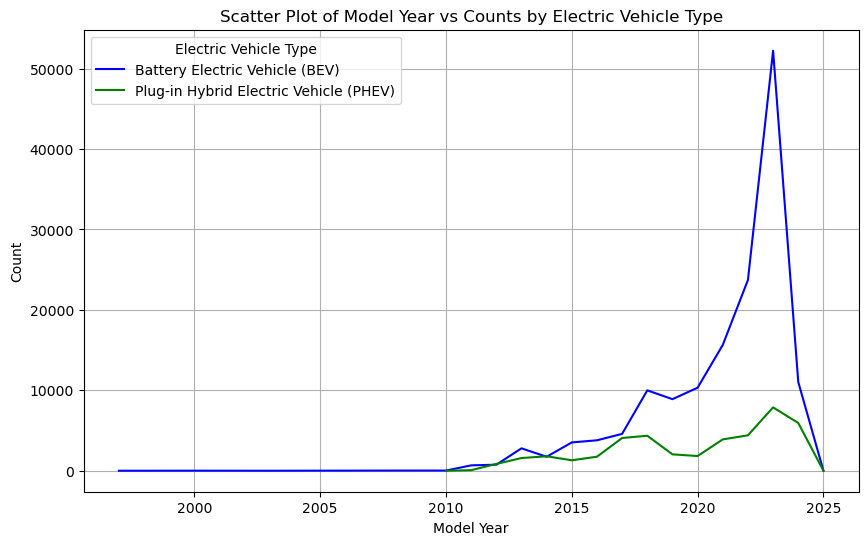

In [44]:
plt.figure(figsize=(10, 6))
model_year_counts = df['Model Year'].value_counts()
model_year_counts = model_year_counts.sort_index(ascending=True)

# Define colors for each Electric Vehicle Type
color_map = {'Battery Electric Vehicle (BEV)': 'blue', 'Plug-in Hybrid Electric Vehicle (PHEV)': 'green'}  # Map each type to a color

# Create scatter plot
plt.figure(figsize=(10, 6))
for ev_type in df['Electric Vehicle Type'].unique():
    subset = df[df['Electric Vehicle Type'] == ev_type]
    print(subset)
    model_year_counts = subset['Model Year'].value_counts()
    model_year_counts = model_year_counts.sort_index(ascending=True)
    plt.plot(model_year_counts.index, model_year_counts.values, label=ev_type, color=color_map[ev_type])

# Customize plot
plt.title('Scatter Plot of Model Year vs Counts by Electric Vehicle Type')
plt.xlabel('Model Year')
plt.ylabel('Count')
plt.legend(title='Electric Vehicle Type')
plt.grid(True)

plt.show()

what moodel type is highest in BEV

        VIN (1-10)        County       City State  Postal Code  Model Year  \
0       5YJSA1E22K          King    Seattle    WA      98112.0        2019   
2       1N4AZ0CP0F          King       Kent    WA      98031.0        2015   
3       5YJSA1H20F     Snohomish    Bothell    WA      98012.0        2015   
5       5YJ3E1EB6K          King    Redmond    WA      98052.0        2019   
6       5YJ3E1EB0J      Thurston       Yelm    WA      98597.0        2018   
...            ...           ...        ...   ...          ...         ...   
191402  5YJ3E1EA0K        Pierce     Sumner    WA      98390.0        2019   
191403  JN1BF0BA7P        Pierce   Wilkeson    WA      98396.0        2023   
191404  7SAYGDEE4R          King  Fall City    WA      98024.0        2024   
191405  7SAXCBE65N  Grays Harbor   Aberdeen    WA      98520.0        2022   
191406  7SAYGAEEXP        Benton   Richland    WA      99352.0        2023   

          Make    Model           Electric Vehicle Type  \
0   

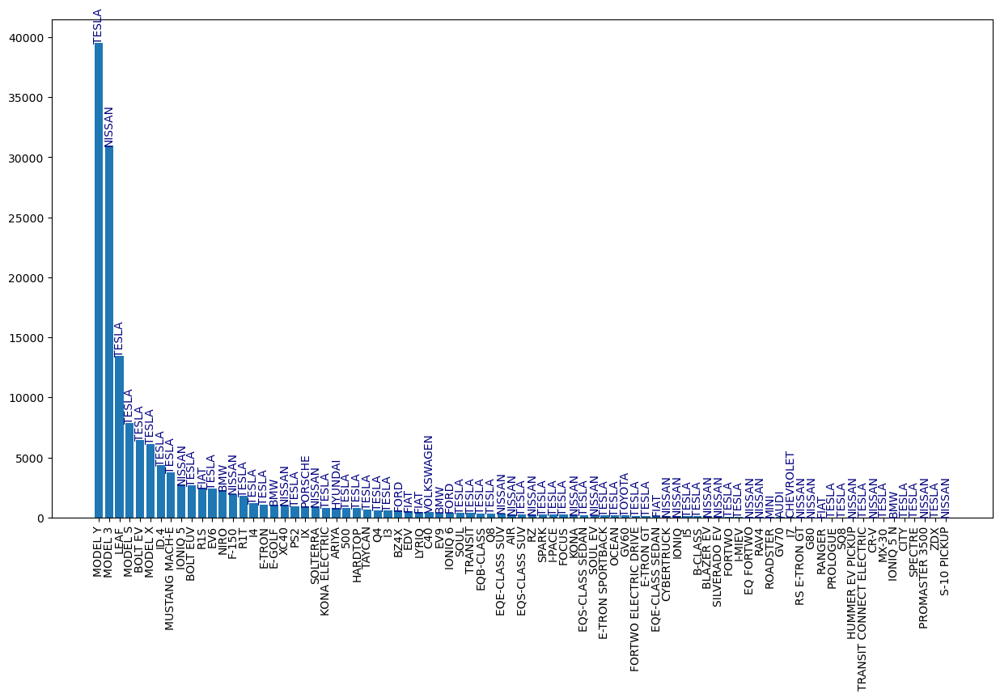

In [60]:
sub = df[df['Electric Vehicle Type'] == 'Battery Electric Vehicle (BEV)']
sub1= df[df['Electric Vehicle Type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)']
print(sub)
print(sub1)
model_type_counts = sub['Model'].value_counts()

plt.figure(figsize=(15,8))
bars=plt.bar(model_type_counts.index,model_type_counts.values)
plt.xticks(rotation='vertical')
for bar, make in zip(bars, sub['Make']):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, make, ha='center', va='bottom', fontsize=10, color='navy',rotation=90)


<AxesSubplot:xlabel='Electric Range', ylabel='Count'>

c:\Users\pbona\anaconda3\envs\ox\lib\site-packages\IPython\core\events.py:89: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



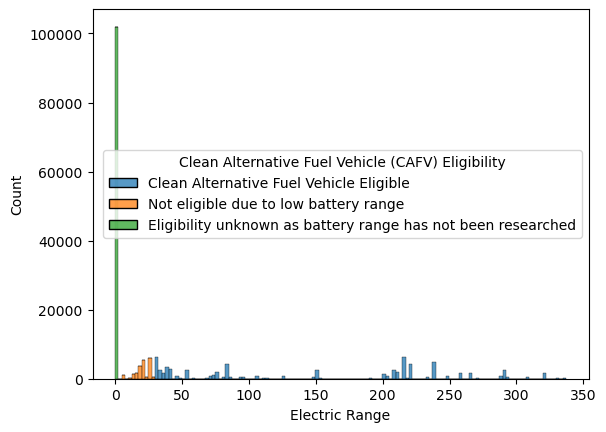

In [66]:
sns.histplot(data=df, x="Electric Range", hue="Clean Alternative Fuel Vehicle (CAFV) Eligibility", multiple="stack")